<p>
    <a href="https://umt.edu.al/" target="_blank">
    <img src="https://umt.edu.al/wp-content/uploads/2024/11/Universiteti-Metropolitan-Tirana.webp" width="200" alt="UMT Logo">
    </a>
</p>
<p>
    <a href="https://skills.network" target="_blank">
    <img src="https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/assets/logos/SN_web_lightmode.png" width="200" alt="Skills Network Logo">
    </a>
</p>

**<h1> Manipulimi i Imazheve </h1>**

Koha e nevojshme e percaktuar: **+60** minuta

<h2>Objectivat</h2>

Në këtë laborator, do të mësoni si të manipuloni imazhet, si në formën e arrays ashtu edhe si objekte imazhi PIL. Do të mësoni si të kopjoni një imazh për të shmangur aliasing-un. Ne do të trajtojmë kthimin e imazheve dhe prerjen e imazheve. Do të mësoni gjithashtu të ndryshoni pikslet e imazheve; kjo do t'ju lejojë të vizatoni figura, të shkruani tekste dhe të mbivendosni imazhe mbi imazhe të tjera.

<ul>
    <li><a href='#MI'>Manipulimi i Imazheve</a>
        <ul>
            <li> Kopjimi i Imazheve</li>
            <li> Kthimi i Imazheve</li>
            <li> Prerja e një Imazhi</li>
            <li> Ndryshimi i Pikseve të Përcaktuara të Imazhit</li> 
        </ul>
    </li>
</ul>


----


Shkarkoni imazhet për laboratorin:

In [3]:
import requests

# URL-të për imazhet
urls = [
    "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/cat.png",
    "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png",
    "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png"
]

# Përshtatja dhe shkarkimi i imazheve
for url in urls:
    response = requests.get(url)
    with open(url.split("/")[-1], 'wb') as file:
        file.write(response.content)


Importojme funksionet e domosdoshme per kete laborator:

In [4]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

## Kopjimi i Imazheve

Nëse dëshironi të riassignoni një array në një tjetër variabël, duhet të përdorni metodën `copy`.

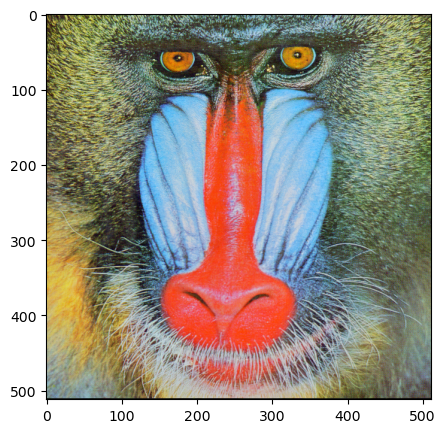

In [5]:
baboon = np.array(Image.open('baboon.png'))
plt.figure(figsize=(5,5))
plt.imshow(baboon )
plt.show()

Nëse nuk e aplikojmë metodën `copy()`, të dyja variablat do të tregojnë në të njëjtin vend në memorie.

In [6]:
A = baboon

Përdorim funksionin `id` për të gjetur adresën e memorjes së një variabli; ne shohim që objektet në hapësirën e memories të cilat variablat `A` dhe `baboon` tregojnë janë të njëjta.

In [7]:
id(A) == id(baboon)

True

Megjithatë, nëse aplikohet metoda `copy()`, adresat e tyre të memorjes do të jenë të ndryshme.

In [8]:
B = baboon.copy()
id(B)==id(baboon)

False

Mund të ketë sjellje të papritura kur dy variabla tregojnë në të njëjtin objekt në memorie. Merrni parasysh array-n `baboon`. Nëse i vendosim të gjitha elementet e tij në zero, të gjitha elementet në `A` do të bëhen gjithashtu zero. Megjithatë, pasi `baboon` dhe `B` tregojnë në objekte të ndryshme, vlerat në `B` nuk do të preken.

In [9]:
baboon[:,:,] = 0

Mund të krahasojmë variablat <code>baboon</code> dhe array-n <code>A</code>:

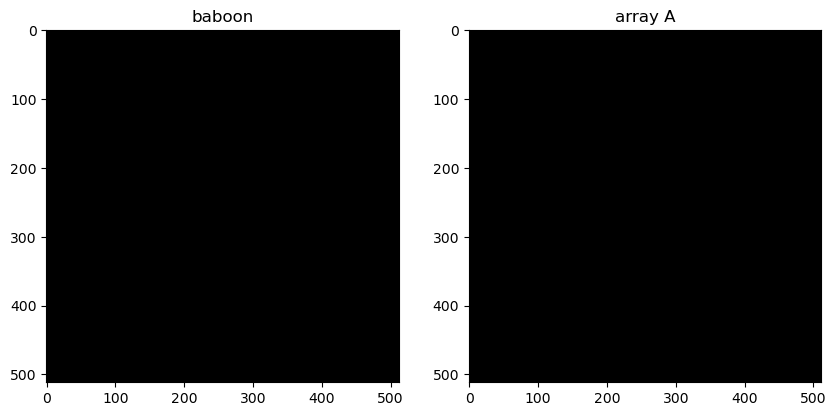

In [10]:
plt.figure(figsize=(10,10))
plt.subplot(121)
plt.imshow(baboon)
plt.title("baboon")
plt.subplot(122)
plt.imshow(A)
plt.title("array A")
plt.show()

Ne shohim që ato janë të njëjta. Kjo sjellje quhet aliasing. Aliasing ndodh sa herë që vlera e një variabli i caktohet një variabli tjetër. Variablat janë referenca për vlerat në memorie.

Ne mund të krahasojmë gjithashtu <code>baboon</code> dhe array-n <code>B</code>:

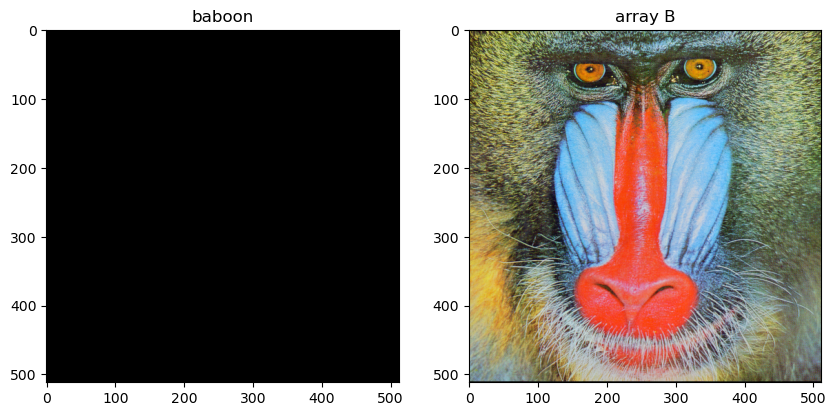

In [11]:
plt.figure(figsize=(10,10))
plt.subplot(121)
plt.imshow(baboon)
plt.title("baboon")
plt.subplot(122)
plt.imshow(B)
plt.title("array B")
plt.show()

Nëse një funksion i PIL nuk kthen një imazh të ri, i njëjti parim zbatohet. Do të kalojmë disa shembuj më vonë.

## Reflektimi(Flipping) i Imazheve

Kthimi i imazheve përfshin ri-renditjen e indekseve të pikseve në mënyrë që të ndryshojë orientimin e imazhit. Merrni parasysh imazhin e mëposhtëm:

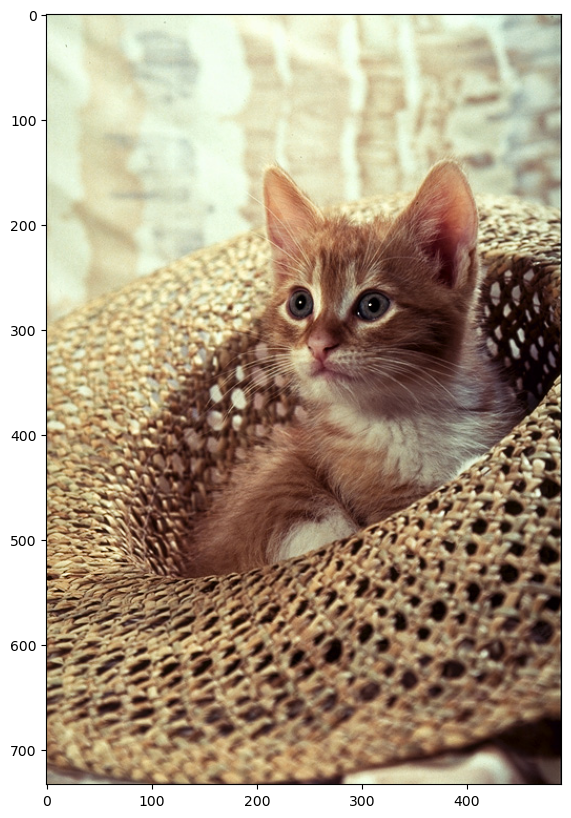

In [12]:
image = Image.open("cat.png")
plt.figure(figsize=(10,10))
plt.imshow(image)
plt.show()

Mund ta shndërrojmë në një array dhe të gjejmë formën e tij:

In [14]:
array = np.array(image)
width, height, C = array.shape
print('width, height, C:', width, height, C)

width, height, C: 733 490 3


Le të kthejmë, pra të rrotullojmë vertikalisht, imazhin. Le të provojmë qasjen tradicionale. Së pari, krijojmë një array të së njëjtës madhësi me tipin e të dhënave <code>np.uint8</code>.

In [15]:
array_flip = np.zeros((width, height, C), dtype=np.uint8)

Ne i caktojmë rreshtin e parë të pikseve të array-t origjinal në rreshtin e fundit të array-t të ri. E përsërisim procesin për çdo rresht, duke rritur numrin e rreshtit në array-n origjinal dhe duke ulur indeksin e rreshtit të array-t të ri për të caktuar pikselët përkatës. Pas ekzekutimit të ciklit për më poshtë, `array_flip` do të bëhet imazhi i kthyer.

In [16]:
for i,row in enumerate(array):
    array_flip[width - 1 - i, :, :] = row

<code>PIL</code> ka disa mënyra për të kthyer një imazh, për shembull, mund të përdorim modulën <code>ImageOps</code>:

In [17]:
from PIL import ImageOps

Metoda `flip()` e modulit `ImageOps` kthen imazhin. Metoda `mirror()` do të pasqyrojë imazhin:

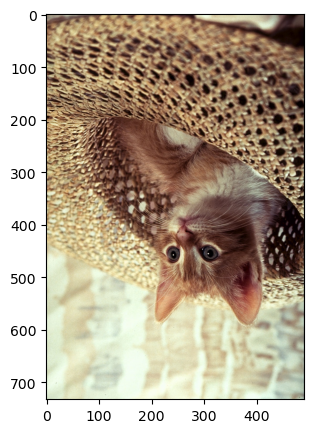

In [19]:
im_flip = ImageOps.flip(image)
plt.figure(figsize=(5,5))
plt.imshow(im_flip)
plt.show()

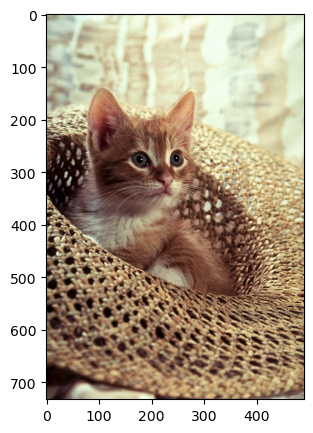

In [20]:
im_mirror = ImageOps.mirror(image)
plt.figure(figsize=(5,5))
plt.imshow(im_mirror)
plt.show()

Mund të përdorim metodën <code>transpose()</code>; parametri është një numër i plotë që tregon se çfarë lloj transpozimi dëshirojmë të kryejmë. Për shembull, mund të kthejmë imazhin duke përdorur një vlerë prej `1`.

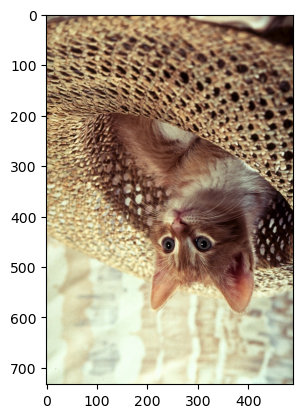

In [21]:
im_flip = image.transpose(1)
plt.imshow(im_flip)
plt.show()

Moduli Image ka atribute të integruara që përshkruajnë llojin e kthesës. Vlerat janë thjesht numra të plotë. Disa prej tyre janë të treguara në <code>dict</code>-in e mëposhtëm:

In [22]:
flip = {"FLIP_LEFT_RIGHT": Image.FLIP_LEFT_RIGHT,
        "FLIP_TOP_BOTTOM": Image.FLIP_TOP_BOTTOM,
        "ROTATE_90": Image.ROTATE_90,
        "ROTATE_180": Image.ROTATE_180,
        "ROTATE_270": Image.ROTATE_270,
        "TRANSPOSE": Image.TRANSPOSE, 
        "TRANSVERSE": Image.TRANSVERSE}

C:\Users\User\AppData\Local\Temp\ipykernel_18860\1430603750.py:1: DeprecationWarning: FLIP_LEFT_RIGHT is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.FLIP_LEFT_RIGHT instead.
  flip = {"FLIP_LEFT_RIGHT": Image.FLIP_LEFT_RIGHT,
C:\Users\User\AppData\Local\Temp\ipykernel_18860\1430603750.py:2: DeprecationWarning: FLIP_TOP_BOTTOM is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.FLIP_TOP_BOTTOM instead.
  "FLIP_TOP_BOTTOM": Image.FLIP_TOP_BOTTOM,
C:\Users\User\AppData\Local\Temp\ipykernel_18860\1430603750.py:3: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  "ROTATE_90": Image.ROTATE_90,
C:\Users\User\AppData\Local\Temp\ipykernel_18860\1430603750.py:4: DeprecationWarning: ROTATE_180 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_180 instead.
  "ROTATE_180": Image.ROTATE_180,
C:\Users\User\AppData\Local\Temp\ipykernel_18860\143

Ne shohim që vlerat janë numra të plotë.

In [24]:
flip["FLIP_LEFT_RIGHT"]

<Transpose.FLIP_LEFT_RIGHT: 0>

Mund të vizualizojmë secilën nga daljet duke përdorur vlera të ndryshme të parametrave:

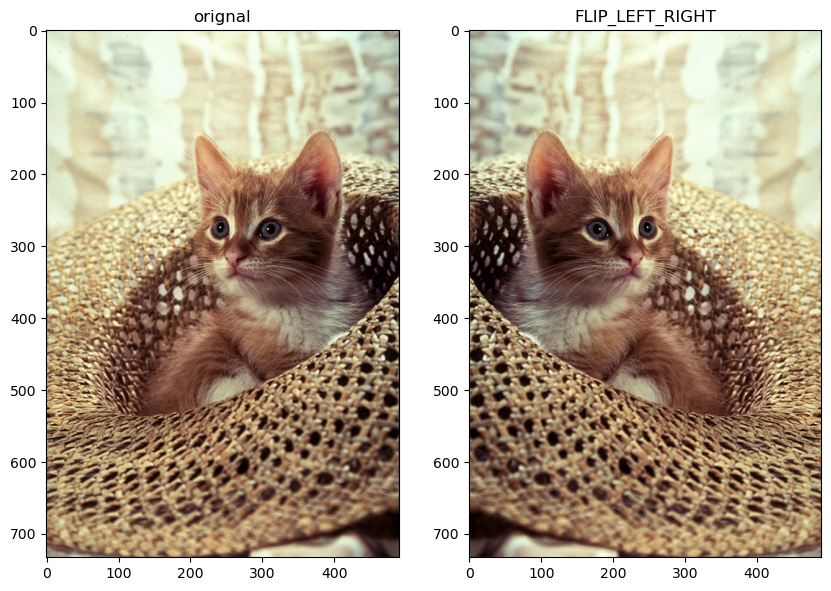

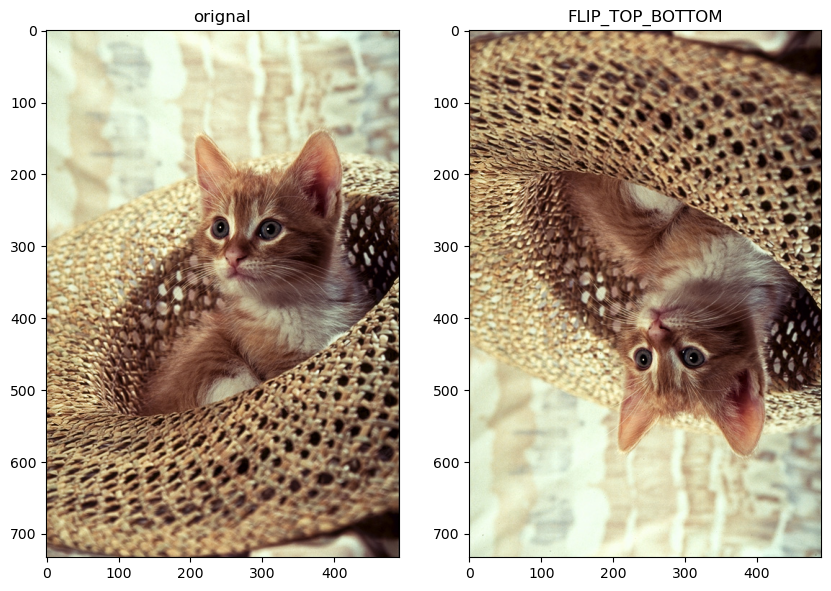

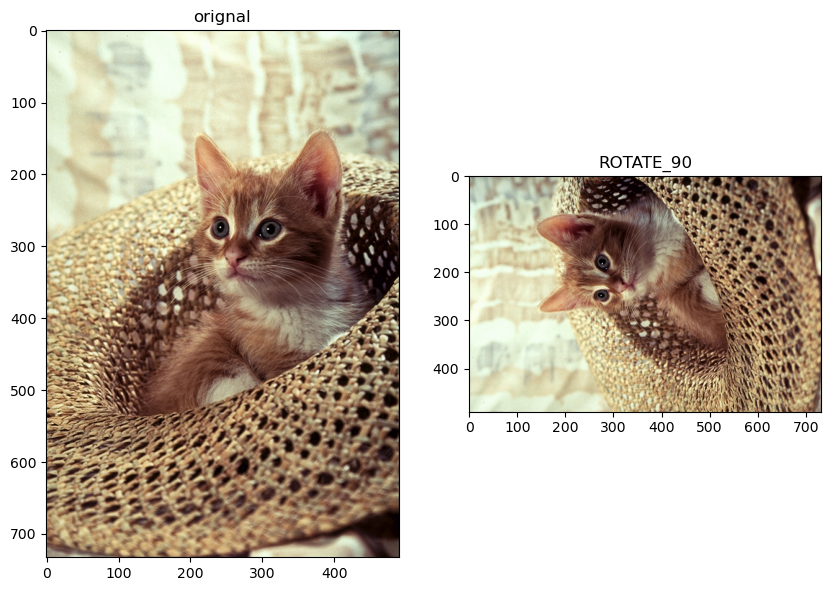

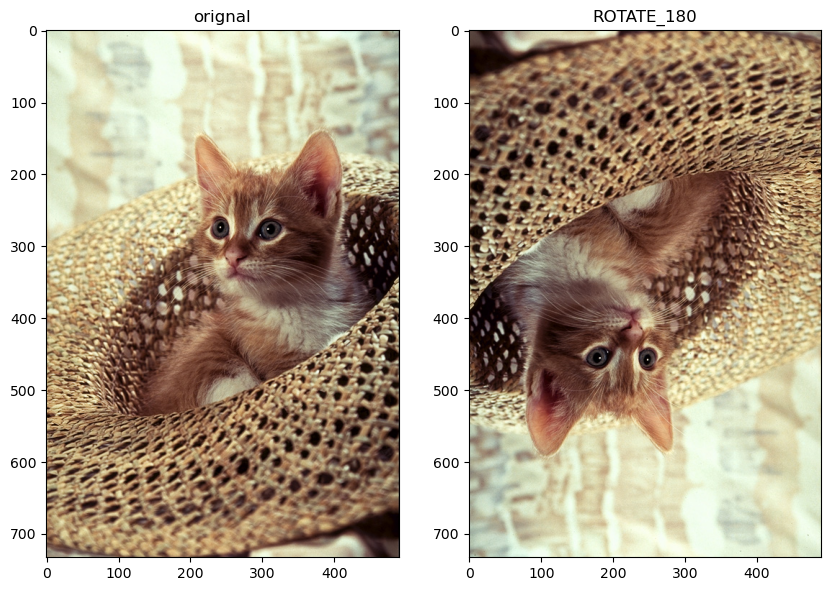

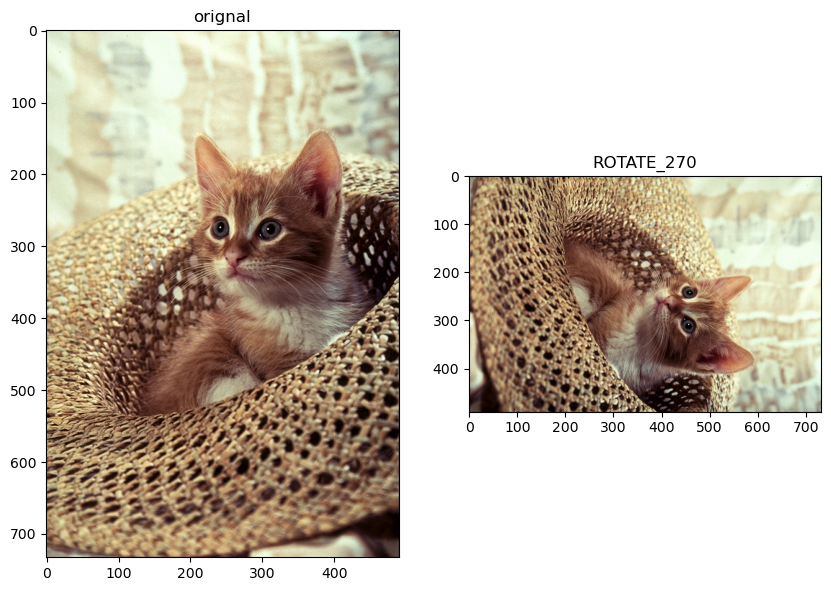

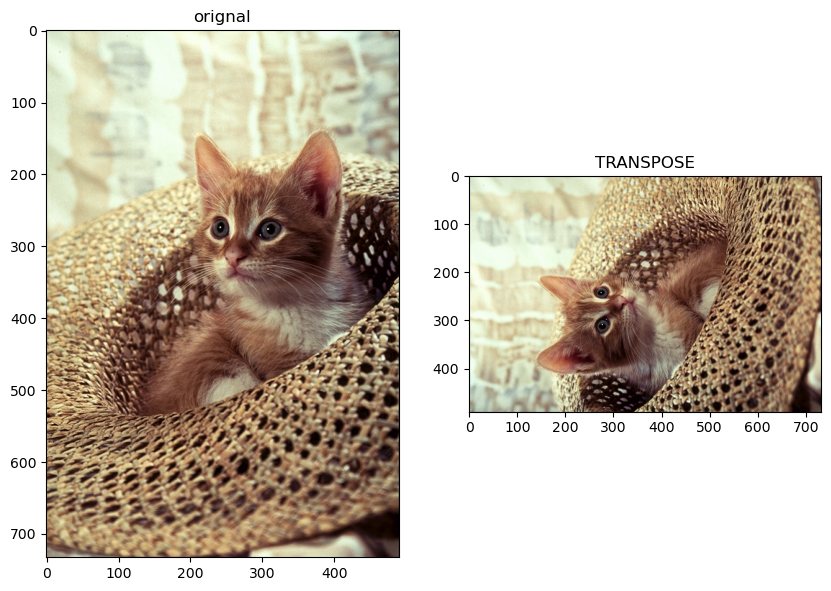

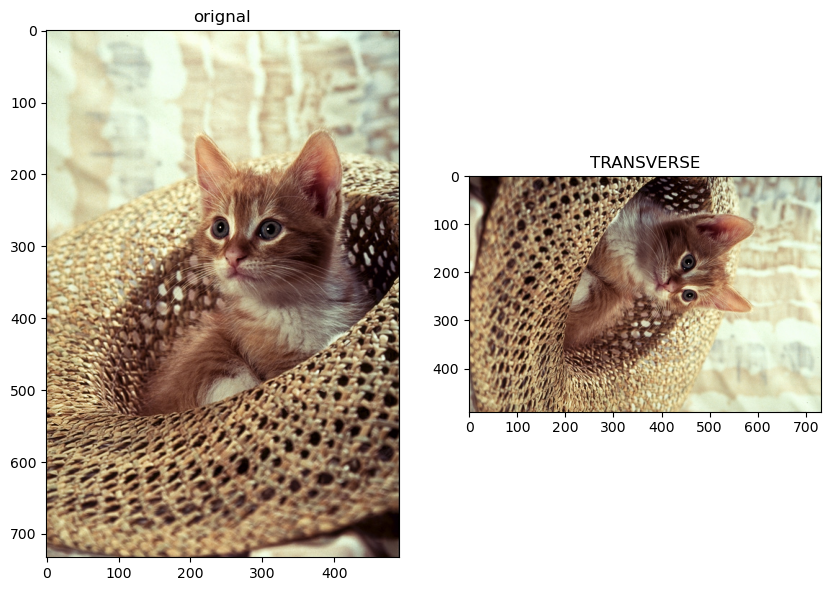

In [26]:
for key, values in flip.items():
    plt.figure(figsize=(10,10))
    plt.subplot(1,2,1)
    plt.imshow(image)
    plt.title("orignal")
    plt.subplot(1,2,2)
    plt.imshow(image.transpose(values))
    plt.title(key)
    plt.show()

## Prerja e një Imazhi 

Prerja është akti i "prerjes" së një pjese të imazhit dhe hedhjes së pjesës tjetër. Mund të kryejmë prerje duke përdorur slicing të array-it.

Le të fillojmë me një prerje vertikale: variabli `upper` është indeksi i rreshtit të parë që dëshirojmë të përfshijmë në imazh, variabli `lower` është indeksi i rreshtit të fundit që dëshirojmë të përfshijmë. Më pas kryejmë slicing të array-it për të marrë imazhin e ri.

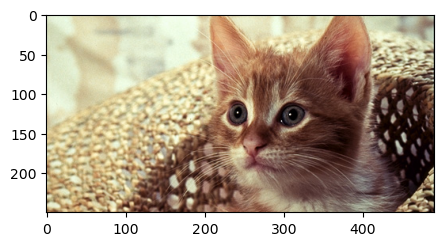

In [27]:
upper = 150
lower = 400
crop_top = array[upper: lower,:,:]
plt.figure(figsize=(5,5))
plt.imshow(crop_top)
plt.show()

Merrni parasysh array-n `crop_top`: gjithashtu mund të bëjmë prerje horizontale. Variabli `right` është indeksi i kolonës së parë që dëshirojmë të përfshijmë në imazh dhe variabli `left` është indeksi i kolonës së fundit që dëshirojmë të përfshijmë në imazh.

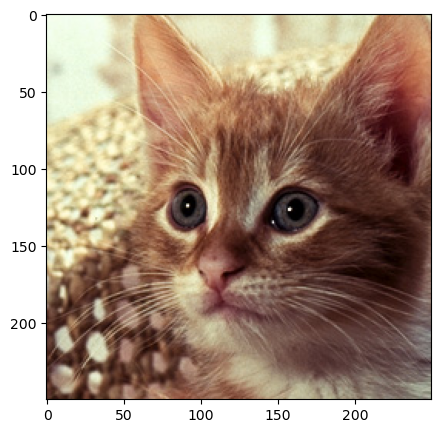

In [28]:
left = 150
right = 400
crop_horizontal = crop_top[: ,left:right,:]
plt.figure(figsize=(5,5))
plt.imshow(crop_horizontal)
plt.show()

Mund të prerë imazhin PIL duke përdorur metodën <code>crop()</code>, duke përdorur parametrat nga më sipër. Caktoni zonën e prerjes me <code>box=(left, upper, right, lower)</code>.

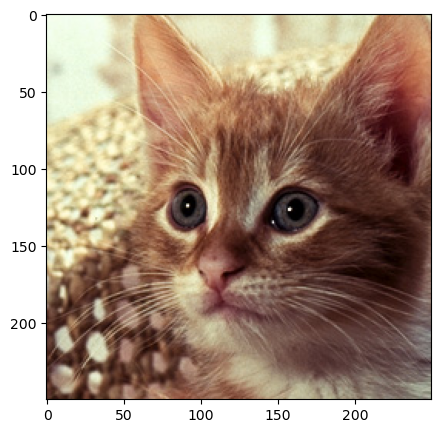

In [29]:
image = Image.open("cat.png")
crop_image = image.crop((left, upper, right, lower))
plt.figure(figsize=(5,5))
plt.imshow(crop_image)
plt.show()

Gjithashtu mund të kthejmë(flipp) imazhin e ri:

C:\Users\User\AppData\Local\Temp\ipykernel_18860\1661611475.py:1: DeprecationWarning: FLIP_LEFT_RIGHT is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.FLIP_LEFT_RIGHT instead.
  crop_image = crop_image.transpose(Image.FLIP_LEFT_RIGHT)


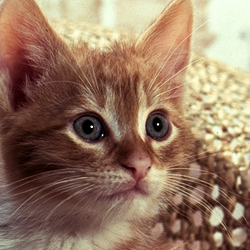

In [30]:
crop_image = crop_image.transpose(Image.FLIP_LEFT_RIGHT)
crop_image

## Ndryshimi i Pikseleve të caktuar të Imazhit

Mund të ndryshojmë pikselet e përcaktuara të imazhit duke përdorur indekset e array-it; për shembull, mund të vendosim të gjitha kanalet e gjelbërta dhe blu në imazhin origjinal që kemi prerë në zero:

In [31]:
array_sq = np.copy(array)
array_sq[upper:lower, left:right, 1:3] = 0

Mund të krahasojmë rezultatet me imazhin e ri.

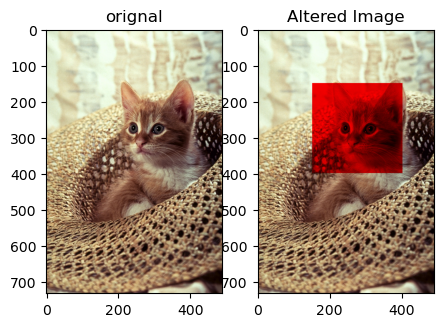

In [32]:
plt.figure(figsize=(5,5))
plt.subplot(1,2,1)
plt.imshow(array)
plt.title("orignal")
plt.subplot(1,2,2)
plt.imshow(array_sq)
plt.title("Altered Image")
plt.show()

Gjithashtu mund të përdorim modulën `ImageDraw` nga biblioteka `PIL`, e cila ofron grafika të thjeshta **2D** për objektet Image.

In [33]:
from PIL import ImageDraw 

Do të kopjojmë objektin e imazhit:

In [34]:
image_draw = image.copy()

Konstruktori `draw` krijon një objekt që mund të përdoret për të vizatuar në imazhin e dhënë. Inputi <code>im</code> është imazhi në të cilin dëshirojmë të vizatojmë.

In [35]:
image_fn = ImageDraw.Draw(im=image_draw)

Cdo metodë që aplikojmë mbi objektin <code>image_fn</code>, do të ndryshojë objektin e imazhit <code>image_draw</code>.

Mund të vizatojmë një drejtkëndësh duke përdorur funksionin <code>rectangle</code>, dy parametra të rëndësishëm përfshijnë: <code>xy</code> – koordinatat e kuti të kufizimit dhe <code>fill</code> – ngjyra e drejtkëndëshit.

In [36]:
shape = [left, upper, right, lower] 
image_fn.rectangle(xy=shape,fill="red")

Ne mund te plotojme imazhin:

plt.figure(figsize=(10,10))
plt.imshow(image_draw)
plt.show()

Ka forma të tjera që mund të përdorim. Për shembull, mund të shtojmë gjithashtu tekst mbi një imazh: përdorim modulën `ImageFont` për të marrë fonte bitmap.

In [39]:
from PIL import ImageFont

Përdorim metodën `text` për të vendosur tekstin mbi imazh. Parametrat përfshijnë `xy` (koordinatat e anorit të majtë të tekstit), parametrin `text` (teksti që do të vizatohet), dhe `fill` (ngjyra që do të përdoret për tekstin).

In [40]:
image_fn.text(xy=(0,0),text="box",fill=(0,0,0))

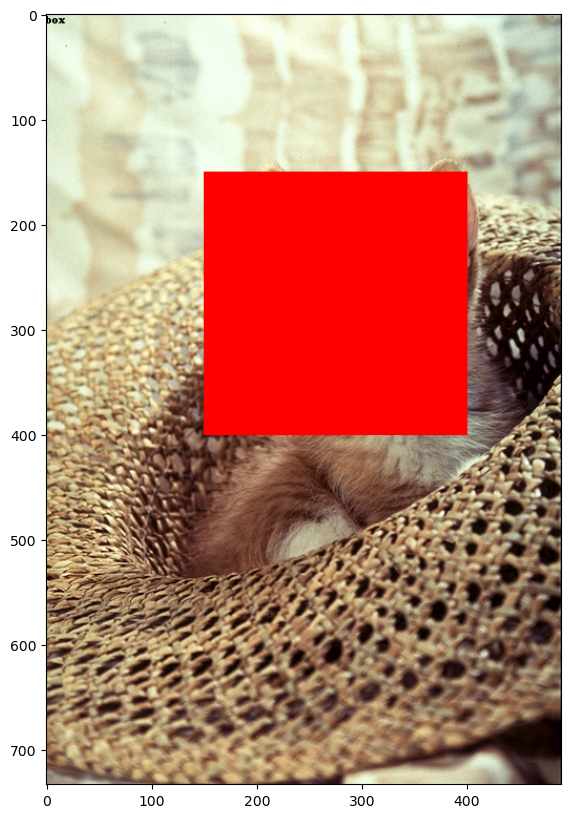

In [41]:
plt.figure(figsize=(10,10))
plt.imshow(image_draw)
plt.show()

Mund të mbivendosim ose ngjitni një imazh mbi një tjetër duke i rassignuar pikselet e një array-i tek ai i tjetri. Merrni parasysh array-n e mëposhtëm të imazhit:

In [42]:
image_lenna = Image.open("lenna.png")
array_lenna = np.array(image_lenna)

Mund të "riversojmë"  vlerat e pikseve si më poshtë:
    

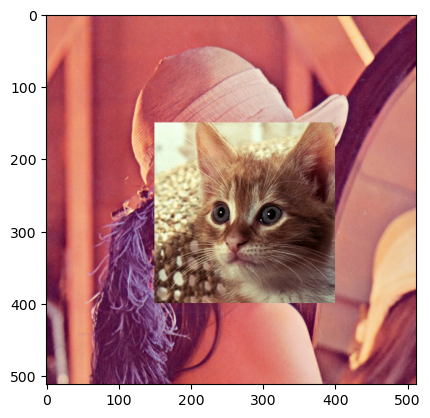

In [44]:
array_lenna[upper:lower,left:right,:]=array[upper:lower,left:right,:]
plt.imshow(array_lenna)
plt.show()

Në të njëjtën mënyrë, metoda <code>paste()</code> ju lejon të mbivendosni një imazh mbi një tjetër, ku inputi është imazhi që dëshironi të mbivendosni. Parametri <code>box</code> është koordinata e majtë dhe e sipërme e imazhit.

In [45]:
image_lenna.paste(crop_image, box=(left,upper))

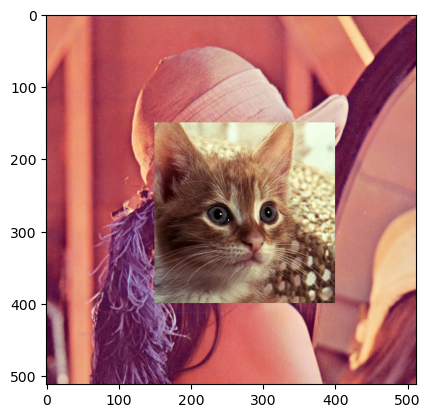

In [46]:
plt.imshow(image_lenna)
plt.show()

Mund të shohim se metoda `copy()` aplikohet në disa objekte <code>PIL</code>. Krijojmë dy objekte imazhesh, vendosim `new_image` në `image`, dhe përdorim metodën `copy()` për objektin `copy_image`.


In [48]:
image = Image.open("cat.png")
new_image=image
copy_image=image.copy()

Siç ndodh me array-n, shohim që ekziston të njëjta marrëdhënie e adresës së memories. Për shembull, nëse nuk përdorim metodën `copy()`, objekti i imazhit ka të njëjtën adresë memories si objekti origjinal i imazhit PIL.

In [49]:
id(image)==id(new_image)

True

Nëse përdorim metodën <code>copy()</code>, adresa është e ndryshme:

In [51]:
id(image)==id(copy_image)

False

If we change the object <code>image</code>, <code>new_image</code> will change, but <code>copy_image</code> will remain the same.

In [52]:
image_fn= ImageDraw.Draw(im=image)
image_fn.text(xy=(0,0),text="box",fill=(0,0,0))
image_fn.rectangle(xy=shape,fill="red")

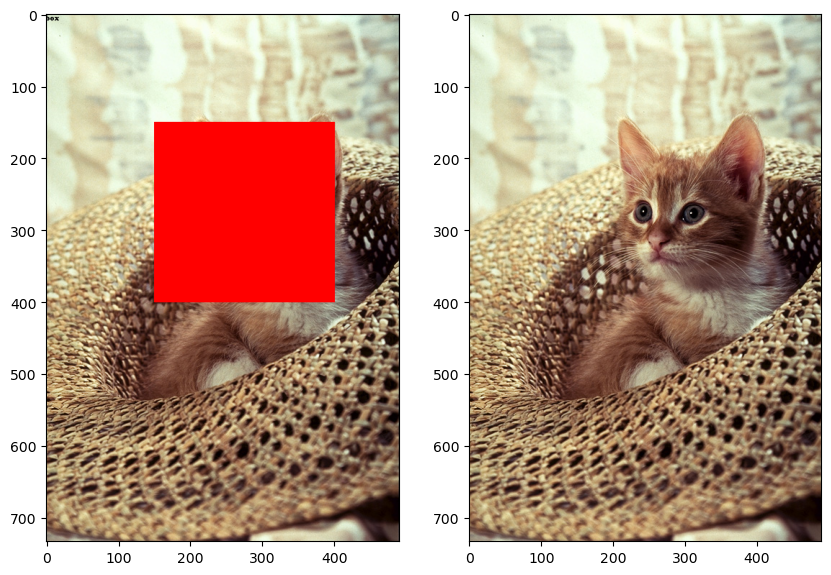

In [53]:
plt.figure(figsize=(10,10))
plt.subplot(121)
plt.imshow(new_image)
plt.subplot(122)
plt.imshow(copy_image)
plt.show()

### Pyetje 1:
Përdorni imazhin `baboon.png` nga ky laborator ose mund të përdorni ndonjë imazh tjetër që dëshironi.

Hapni imazhin dhe krijoni një objekt PIL Image të quajtur `im`, ktheni `im` dhe krijoni një imazh të quajtur `im_flip`. Pasqyroni `im` dhe krijoni një imazh të quajtur `im_mirror`. Në fund, shfaqni të dy imazhet.

In [54]:
# shkruaj zgjidhjen tende ketu:

Klikoni dy herë **këtu** për një sugjerim.

<!-- Sugjerimi është më poshtë:

im_flip = ImageOps.flip(im)
im_mirror = ImageOps.mirror(im)

-->


Klikoni dy herë **këtu** për zgjidhjen:
<!-- Pergjigja eshte me poshte:

im = Image.open("lenna.png")

im_flip = ImageOps.flip(im)
plt.figure(figsize=(5,5))
plt.imshow(im_flip)
plt.show()

-->

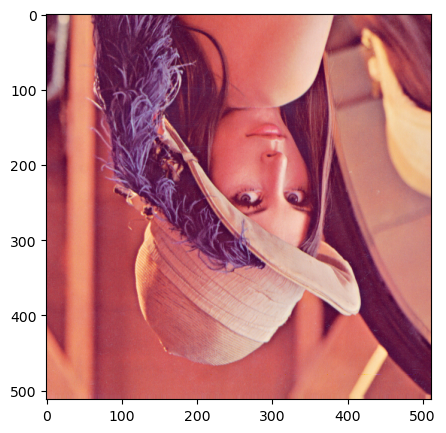

# Referenca

[1]  Images were taken from: https://homepages.cae.wisc.edu/~ece533/images/
    
[2]  <a href='https://pillow.readthedocs.io/en/stable/index.html'>Pillow Docs</a>

[3]  <a href='https://opencv.org/'>Open CV</a>

[4] Gonzalez, Rafael C., and Richard E. Woods. "Digital image processing." (2017).

<h3 align="center"> &#169; UMT. All rights reserved. <h3/>